# Data Visualization for ratings
### Graphs allow data examinationation from a different perspective, help to detect any anomalies of the dataset and give clues on what techniques should be used in order to improve the model. 

In [2]:
# Import session from previus notebook
import dill
dill.load_session('notebook_env.db')

In [3]:
from textblob import TextBlob
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot 
init_notebook_mode(connected=True)
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False, world_readable=True)
from sklearn.feature_extraction.text import CountVectorizer
#https://towardsdatascience.com/a-complete-exploratory-data-analysis-and-visualization-for-text-data-29fb1b96fb6a

# Add extra columns to help visualize
Corpus['polarity'] = Corpus['reviewText'].map(lambda text: TextBlob(text).sentiment.polarity)
Corpus['review_len'] = Corpus['reviewText'].astype(str).apply(len)
Corpus['word_count'] = Corpus['reviewText'].apply(lambda x: len(str(x).split()))

The following graphs provide information about the labels and the sentiment of the text, utilizing the 'overall' column and an extra added column called 'polarity' which includes the sentiment polarity each review. The sentiment polarity is being calculated using the text from the 'reviewText' column and the textBlob library, a library for processing textual data by providing a simple API for diving into common natural language processing (NLP) tasks. Polarity are the emotions expressed in a sentence. In this library it is a score (Float) in the range of [-1,1] where 1 indicates positive sentiment and -1 indicates a negative sentiment. (https://buildmedia.readthedocs.org/media/pdf/textblob/latest/textblob.pdf)

In [4]:
#The distribution of review ratings
Corpus['overall'].iplot(
    kind='hist',
    xTitle='rating',
    linecolor='black',
    yTitle='count',
    title='Review Rating Distribution')

The first graph shows the distribution of the reviews. As it can be observed clearly, there are much more reviews rated with five stars than with fewer stars. More specifically, we have 106000 more reviews rated with five stars than with one star. This undoubtedly will result problems for having unbalanced classes. There are many different techniques to deal with unbalanced classes that we will examine later on.

In [5]:
#The distribution of review sentiment polarity score

Corpus['polarity'].iplot(
    kind='hist',
    bins=50,
    xTitle='polarity',
    linecolor='black',
    yTitle='count',
    title='Sentiment Polarity Distribution')

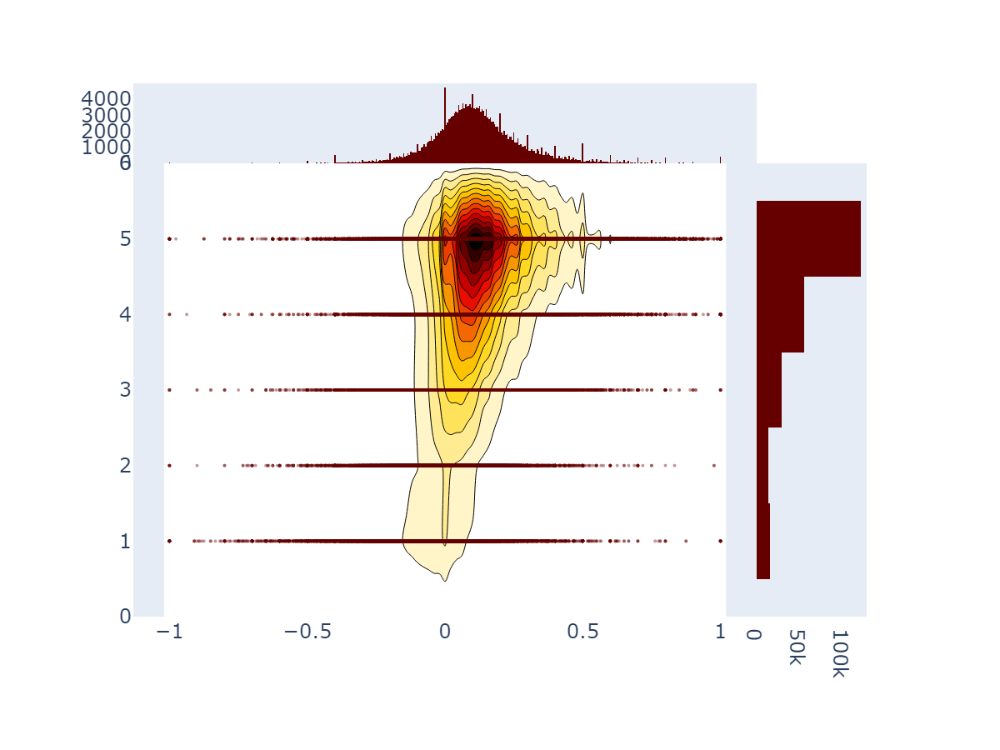

In [15]:
import plotly.graph_objs as go
from plotly.offline import iplot

#2D Density jointplot of sentiment polarity vs. rating
#There were few people are very positive or very negative.

trace1 = go.Scatter(
    x=Corpus['polarity'], y=Corpus['overall'], mode='markers', name='points',
    marker=dict(color='rgb(102,0,0)', size=2, opacity=0.4)
)
trace2 = go.Histogram2dContour(
    x=Corpus['polarity'], y=Corpus['overall'], name='density', ncontours=20,
    colorscale='Hot', reversescale=True, showscale=False
)
trace3 = go.Histogram(
    x=Corpus['polarity'], name='Sentiment polarity density',
    marker=dict(color='rgb(102,0,0)'),
    yaxis='y2'
)
trace4 = go.Histogram(
    y=Corpus['overall'], name='Rating density', marker=dict(color='rgb(102,0,0)'),
    xaxis='x2'
)
data = [trace1, trace2, trace3, trace4]

layout = go.Layout(
    showlegend=False,
    autosize=False,
    width=600,
    height=550,
    xaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    yaxis=dict(
        domain=[0, 0.85],
        showgrid=False,
        zeroline=False
    ),
    margin=dict(
        t=50
    ),
    hovermode='closest',
    bargap=0,
    xaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    ),
    yaxis2=dict(
        domain=[0.85, 1],
        showgrid=False,
        zeroline=False
    )
)

fig = go.Figure(data=data, layout=layout)
fig.show(renderer="png", width=600, height=450, scale = 2)
#iplot(fig, filename='2dhistogram-2d-density-plot-subplots') #replace with the line above for interactive graph

In [16]:
#Save this session for the next notebook
import dill
dill.dump_session('notebook_env.db')